In [7]:

import netCDF4 as nc
import pandas as pd
import numpy as np
from datetime import timedelta, datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os
import pickle


In [8]:

def read_station(folder_path, file_name):
    
    full_path = os.path.join(folder_path, f'{file_name}.txt')
    try:
        # Load observation data from a text file
        # Specify -99999 and -1 as NaN values
        df = pd.read_table(full_path, delim_whitespace=True, na_values=[-99999, -1])

        df['date'] = pd.to_datetime(df['date'])

    except FileNotFoundError:
        print(f"No data: {full_path}")
        return pd.DataFrame()  # Return empty DataFrame if file is not found
    
    return df


In [9]:

def process_geo_data(file_data, index,info_stations):
    
    forecast_dict = {}

    # Iterate over the forecast files
    for forecast in range(0, len(file_data)):

        filename = file_data['File Name'].loc[forecast]
        filename2 = filename.split('_')[0]
        print(filename2)

        issue_date =  file_data['Date'].loc[forecast]
        issue_date = pd.to_datetime(issue_date, utc=True)
        print(issue_date)

        id_reach = info_stations['reach_ids_geoglows'][index]
        df = pd.read_csv(f'{id_reach}/row_data/{filename2}')

        start_date = issue_date + timedelta(days=0.5) # make it center labeled
        print(start_date)

        # Adjust the 'Dates' column to datetime and ensure they are UTC-aware
        df['datetime'] = pd.to_datetime(df['datetime'], utc=True)

        # Group by the date part of the datetime, set the time to noon, calculate the mean, and reset index
        daily_avg = df.groupby(df['datetime'].dt.floor('D') + pd.Timedelta(hours=12)).mean(numeric_only=True).reset_index()
        
        daily_ens =  np.array(daily_avg.drop(columns=['datetime']))
        print(daily_ens)
        
        # Ensure 'Dates' column in daily_avg is also tz-aware UTC
        daily_avg['datetime'] = pd.to_datetime(daily_avg['datetime'])


        daily_ens_mean = daily_avg.mean(axis=1, numeric_only=True)  # add 'numeric_only=True' if there are non-numeric columns to ignore


        # Create a daily time series starting from the start date
        time = [start_date + timedelta(days=i) for i in range(16)]  # Assumes 30 days of data
        
        # Store data in the dictionary using the issue_date as the key
        forecast_dict[issue_date] = {
            'time': time,
            'dis24_ensem': daily_ens,
            'dis24_station': daily_ens_mean.tolist(),
            'start_date': start_date
        }

            # 'dis24_station': daily_avg.tolist(),
    return forecast_dict


In [10]:
def plot_geo_forecasts(forecast_dict, station_name, name_data):
    f = 0

    # Iterate over the forecasts stored in the dictionary
    for issue_date, data in forecast_dict.items():
        f += 1
        time = pd.to_datetime(data['time'])  # Convert to datetime
        dis24_station = data['dis24_station']
        issue_date = pd.to_datetime(issue_date)  # Ensure issue_date is a datetime object

        plt.figure(figsize=(8, 5))
        
        plt.plot(time, dis24_station, color='black', alpha=0.8, label='Forecast')

        # # Normalize the observed data 'date' column to midnight
        # df_obs['date'] = pd.to_datetime(df_obs['date']).dt.normalize()
        # plt.plot(df_obs['date'], df_obs[name_data], color='blue', label='Observed Data')
        
        plt.xlabel('Date')
        plt.ylabel('Discharge (m³/s)')
        plt.title(f'Geo 24-hour Discharge Forecast for {station_name} Station - Issued on {issue_date.date()}')
        plt.xlim(time[0] - timedelta(days=3), time[-1])
        plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=2))
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
        plt.gcf().autofmt_xdate()
        plt.grid(True, color='grey', alpha=0.2)
        plt.tight_layout()
        
        plt.axvline(x=issue_date, color='red', linestyle='--', label='Date of issue')
        
        plt.legend()
        plt.savefig(f'Figures/{station_name}_google_{f}.png', dpi=300)
        plt.show()


In [11]:

name_data = 'discharge'

# -----------------------------------------------------------------------------
# Load station data
info_stations = pd.read_csv('../Documents/porto_alegre_stations_ids.csv')


id_reach = info_stations['reach_ids_geoglows'][0]

files = [file for file in os.listdir(f'{id_reach}/row_data/') if file.endswith('.csv') and '_H' not in file]

file_dates = [file.split('.')[0] for file in files]

file_dates = [datetime.strptime(date, '%Y-%m-%d') for date in file_dates]

file_data = pd.DataFrame({
    'File Name': files,
    'Date': file_dates
}).sort_values(by='Date').reset_index(drop=True)

print(file_data)



         File Name       Date
0   2024-03-31.csv 2024-03-31
1   2024-04-01.csv 2024-04-01
2   2024-04-02.csv 2024-04-02
3   2024-04-03.csv 2024-04-03
4   2024-04-04.csv 2024-04-04
..             ...        ...
86  2024-06-25.csv 2024-06-25
87  2024-06-26.csv 2024-06-26
88  2024-06-27.csv 2024-06-27
89  2024-06-28.csv 2024-06-28
90  2024-06-29.csv 2024-06-29

[91 rows x 2 columns]


----------------------------------------------------------------------------
87450004
CAIS MAUÁ C6
No data: ../Telemetricas\87450004.txt
2024-03-31.csv
2024-03-31 00:00:00+00:00
2024-03-31 12:00:00+00:00
[[  4.29793516   4.22824408   4.41072698   4.34309162   4.2917587
    4.38479908   4.36395088   4.58787461   4.37435596   4.34895783
    4.20764135   4.29244036   4.32835805   4.22083066   4.23646696
    4.30996314   4.33120955   4.3052795    4.28987658   4.16891773
    4.32129186   4.39066579   4.55845611   4.46399383   4.36189006
    4.30824267   4.58307441   4.12389006   4.248104     4.30461935
    4.16298721   4.30125151   4.35948707   4.30402173   4.30955809
    4.26445011   4.37952515   4.24689914   4.51736477   4.28259773
    4.45615876   4.30865725   4.22203255   4.42037276   4.15813964
    4.420053     4.31870045   4.23471156   4.2338989    4.22311305
    4.3339122 ]
 [  2.52298146   2.28483829   2.87730102   2.57220272   2.43818696
    2.98532214   2.66513476   3.56405621   2

C:\Users\ingri\AppData\Local\Temp\ipykernel_29392\2608100217.py:7: FutureWarning: The 'delim_whitespace' keyword in pd.read_table is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_table(full_path, delim_whitespace=True, na_values=[-99999, -1])


[[  4.7290342    4.7339484    5.66548762   5.10970341   5.73839109
    5.07635258   7.59598422   6.07163454   4.84609659   5.24552659
    4.81738731   4.88523704   5.46843004   4.87108401   4.89952473
    5.00760672   4.74766852   4.72029624   5.0127099   17.119454
    4.94915125   5.86518341   4.96905494   6.92855654   7.60661538
    5.07614831  12.61177195   5.77160066   4.64043915   6.88989956
    4.79569691   4.91977851   4.95961609   4.93905073   4.73934843
    4.91282091   4.98242463  30.90478931   4.99227276   4.73640703
    5.11953949   5.43171736   6.34065176   5.26357109   5.57320567
    4.99295096   4.90812533   4.65350214   5.79508125   5.1429916
    4.75251808]
 [  2.76145591   2.77724744   3.68084268   2.90866241   4.65250416
    3.30794764   4.83382965   6.3759007    3.10421886   3.54372036
    2.66504944   2.91257224   7.13153125   2.37586737   4.18727206
    3.84230531   2.96262341   2.8611486    2.83506099  22.77421287
    3.17059742   4.77094047   3.53608545   7.6304

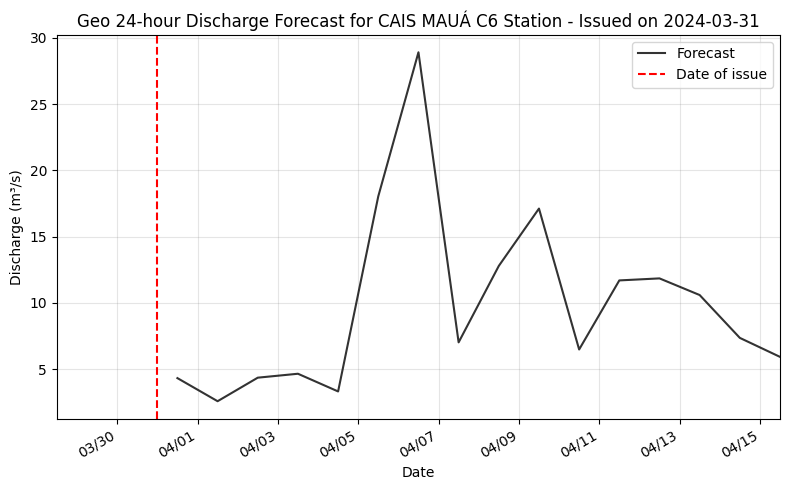

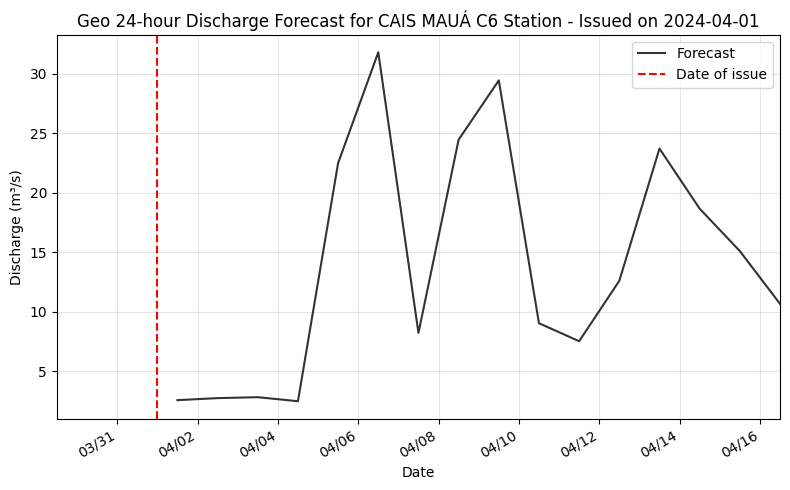

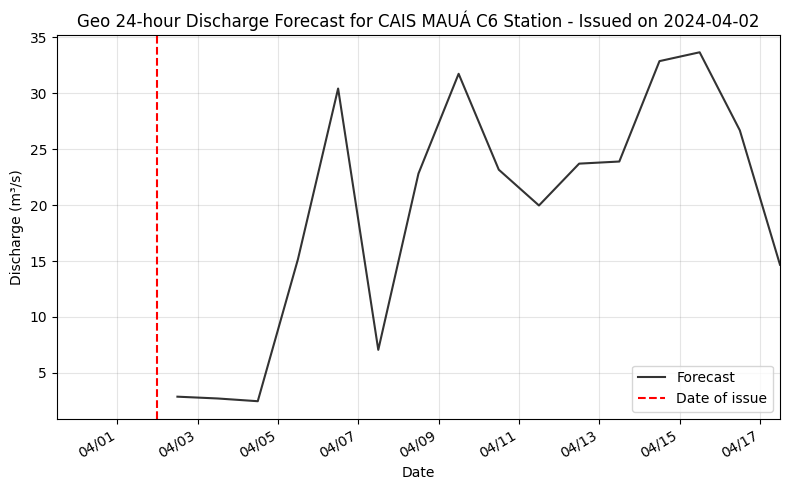

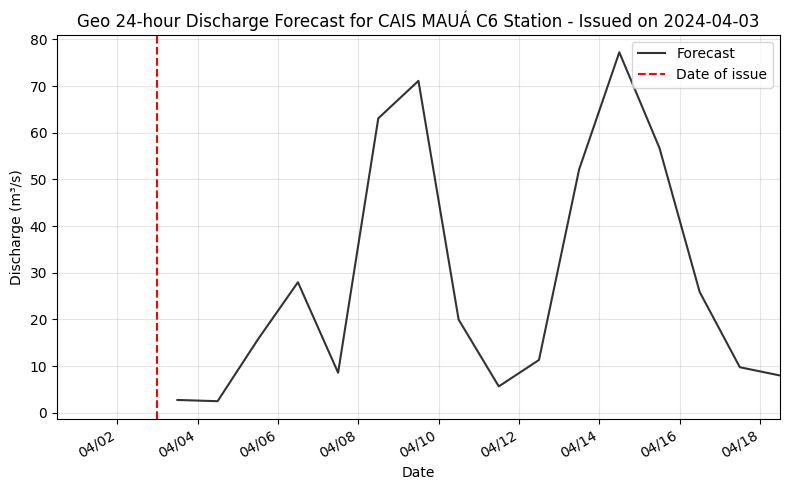

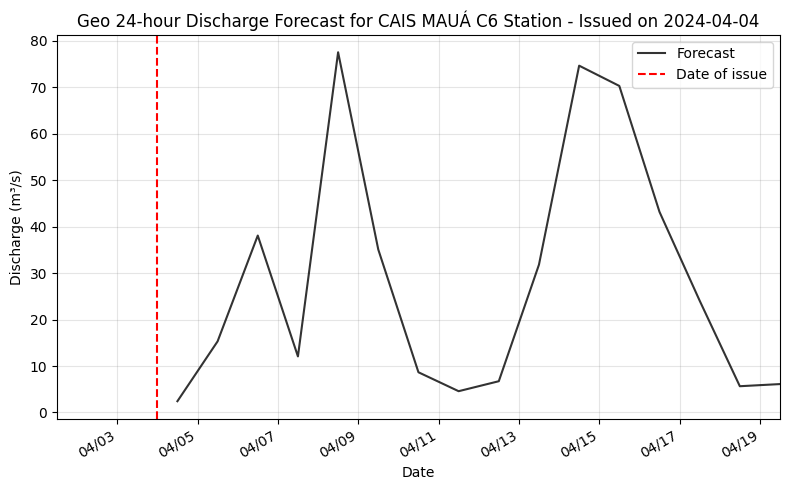

...

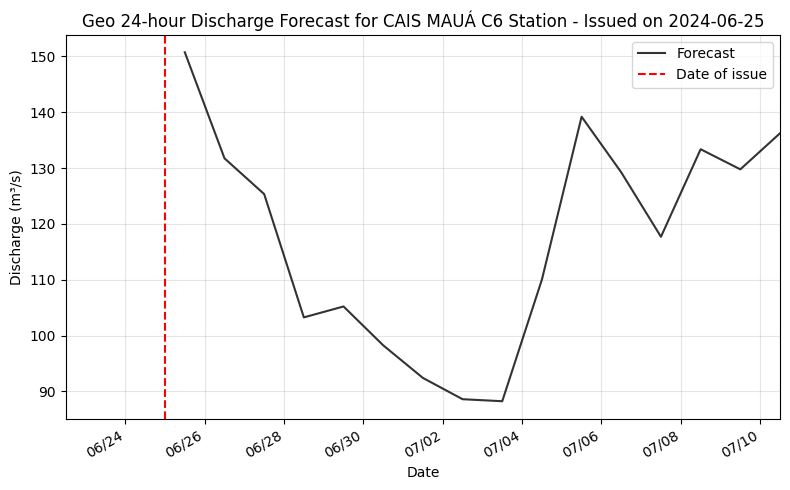

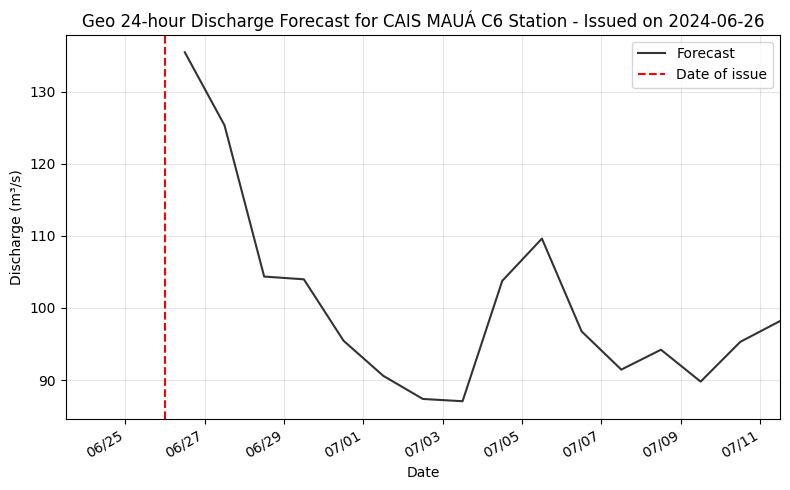

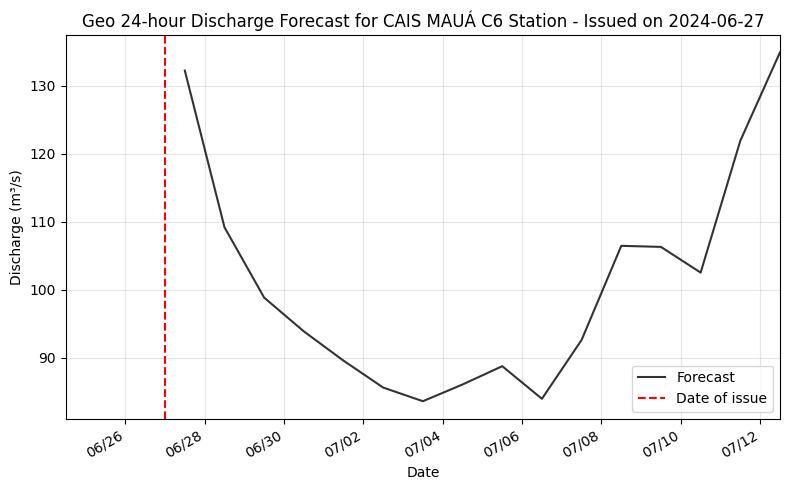

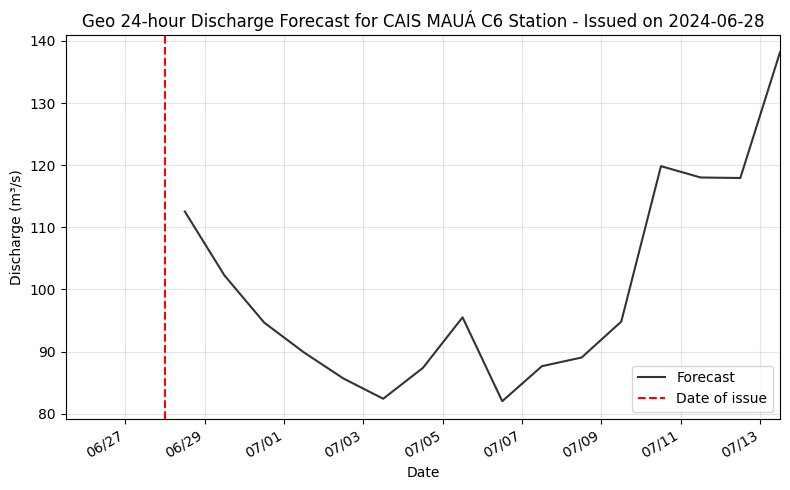

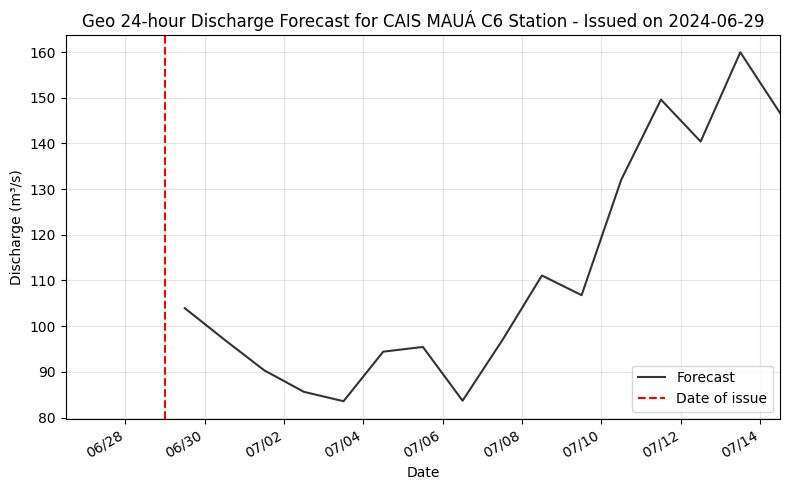

----------------------------------------------------------------------------
87010000
TRIUNFO
No data: ../Telemetricas\87010000.txt
2024-03-31.csv
2024-03-31 00:00:00+00:00
2024-03-31 12:00:00+00:00
[[ 302.5762875   302.37370125  302.6943275   302.3034225   302.3702775
   302.53601875  302.4614075   302.7687625   302.4855775   302.29341625
   302.396425    302.50871625  302.36528375  302.34647     302.38138125
   302.43562625  302.44084     302.44188125  302.425145    302.52969875
   302.71171875  302.30796875  302.54082625  302.74392875  302.88655125
   302.89074375  302.717625    302.33876625  302.37022625  302.62800875
   302.3285325   302.5469875   302.43752     302.58552     302.60828125
   302.43679     302.87799125  302.62433125  302.55855625  302.46685125
   302.58966875  302.40611625  302.409745    302.5007125   302.35513875
   302.7244075   302.501       302.5337375   302.57284375  302.23941875
   302.42602875]
 [ 259.81932875  258.12844     259.623465    257.766405    258.24

C:\Users\ingri\AppData\Local\Temp\ipykernel_29392\2608100217.py:7: FutureWarning: The 'delim_whitespace' keyword in pd.read_table is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_table(full_path, delim_whitespace=True, na_values=[-99999, -1])


2024-04-11 12:00:00+00:00
[[ 788.9322825   788.85254375  789.590785    788.56425625  788.5317
   792.2176975   788.86541     789.3205475   789.51552625  788.969925
   789.13862875  788.72135875  789.23180375  788.61138625  789.20954125
   789.1697175   789.86129125  790.08151875  789.95530875  790.81590375
   789.1174125   788.9450375   788.9042025   789.81426375  789.874065
   791.43534125  788.85254125  788.627       788.81265625  791.05234375
   789.2634375   790.8795925   788.81354625  788.72693375  791.10989
   790.252285    789.201015    789.39224     790.700565    789.4293
   789.45791625  788.68891875  789.0163      789.22318625  788.47056
   791.35573875  788.9591375   789.2202325   789.964025    789.10836
   788.95513375]
 [ 847.682565    858.08536     834.442215    829.487905    839.16172625
   853.6946225   833.37407875  836.38921875  831.6544125   840.4229625
   836.6205825   829.5665925   832.1716225   830.3580925   844.87011
   831.55534875  834.33602375  844.10705125  8

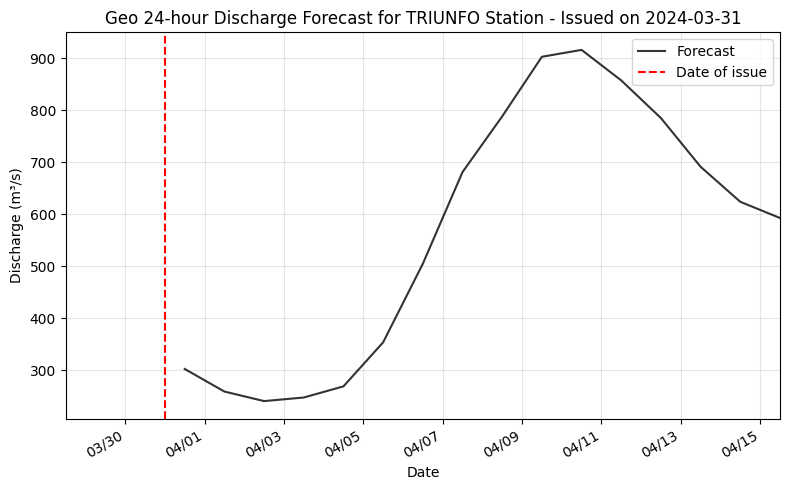

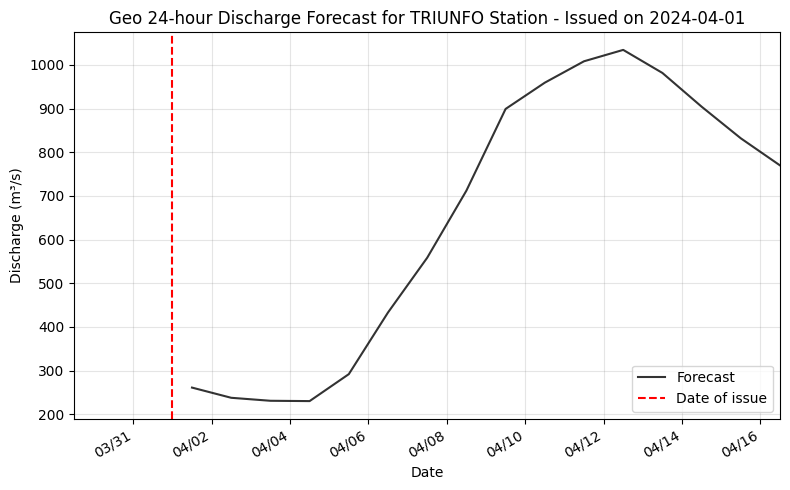

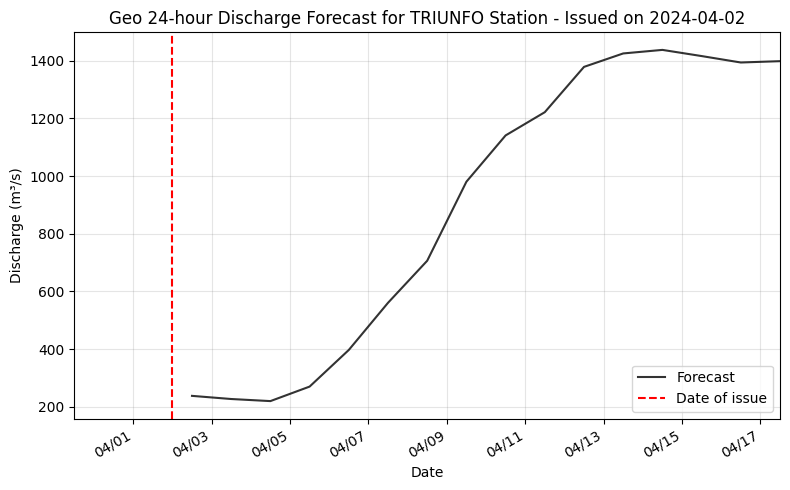

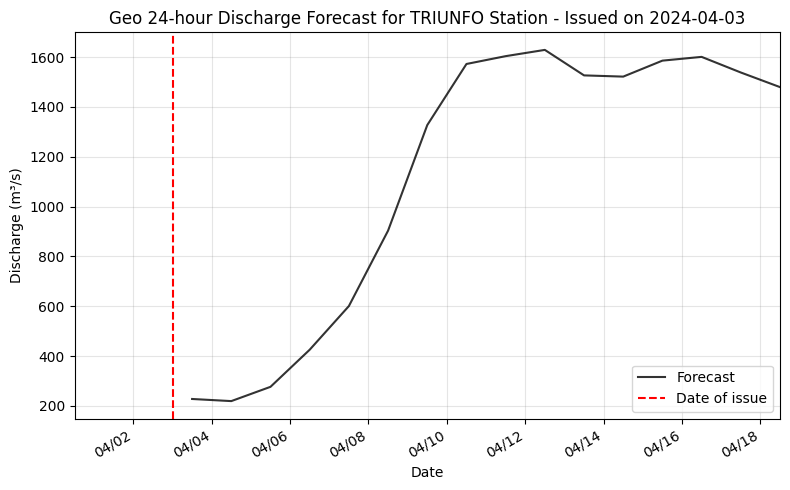

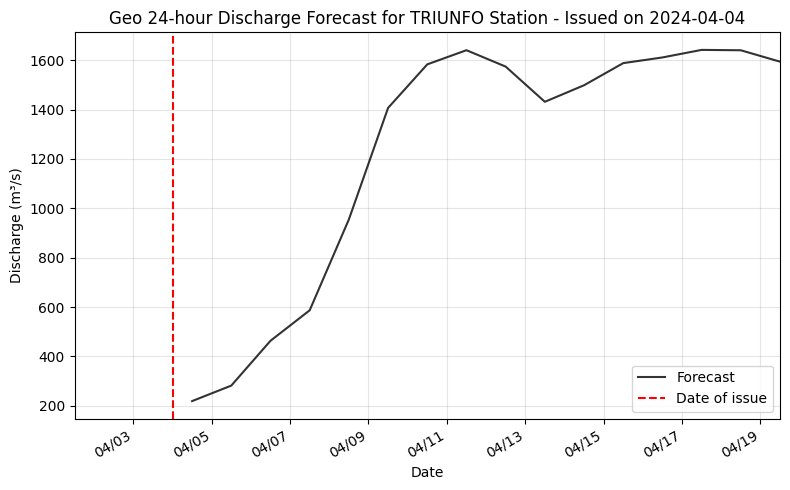

...

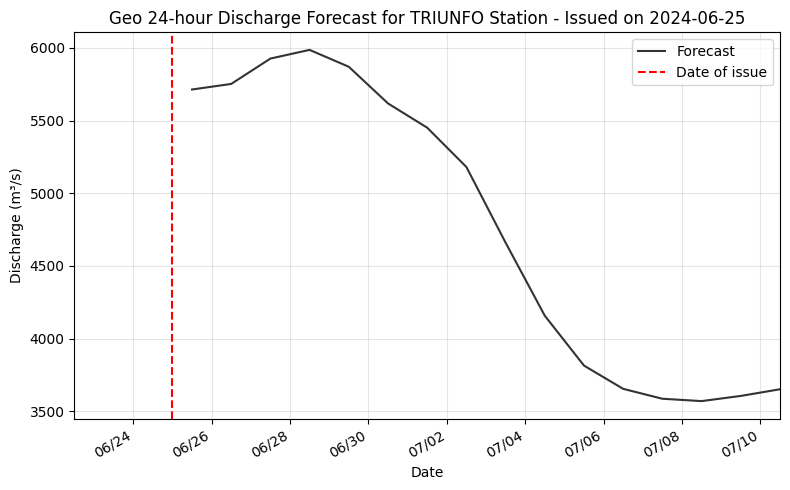

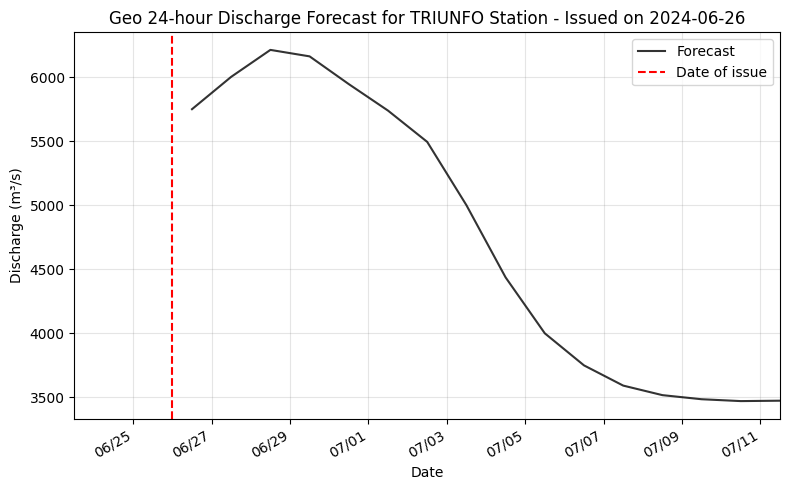

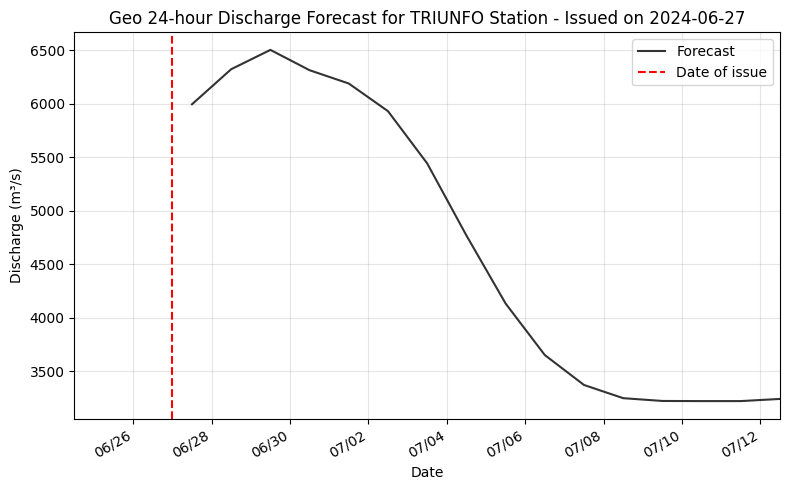

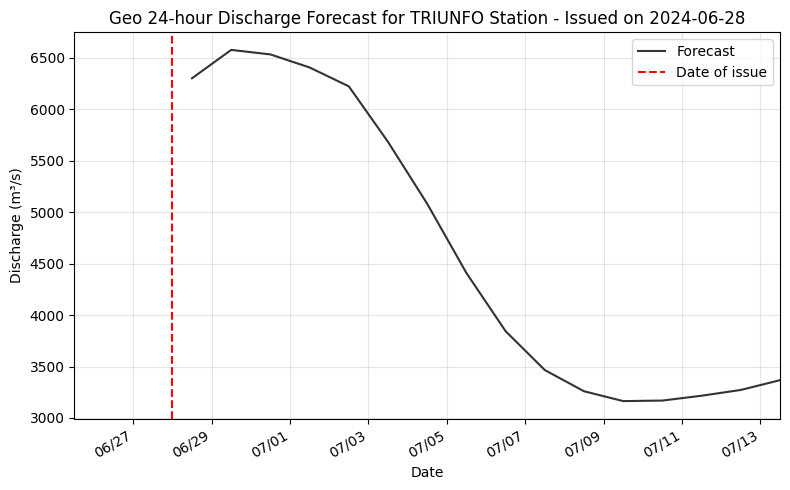

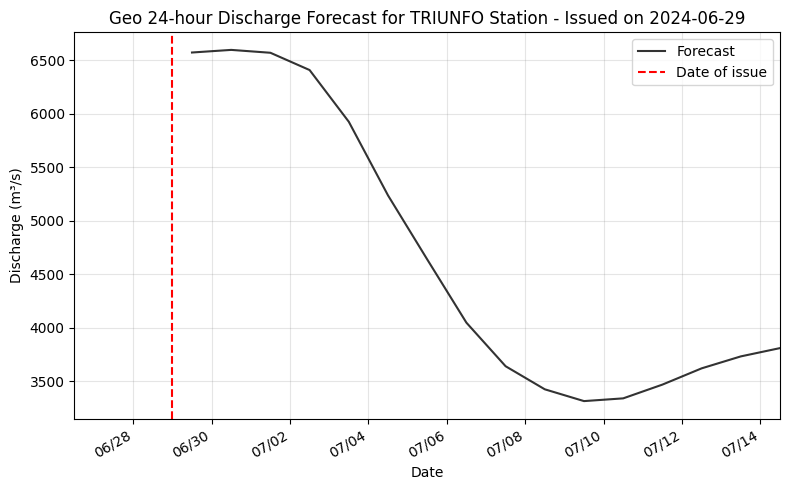

----------------------------------------------------------------------------
87270000
PASSO MONTENEGRO
No data: ../Telemetricas\87270000.txt
2024-03-31.csv
2024-03-31 00:00:00+00:00
2024-03-31 12:00:00+00:00
[[ 20.64588225  20.275352    20.57458275  20.0603485   20.162505
   20.232025    20.40114988  20.39552537  20.53456588  20.17933175
   20.498039    20.22390725  20.55445275  20.2509245   20.46770138
   20.33266062  20.22354125  20.11006838  19.98383988  20.25785937
   20.62486725  20.08701269  20.52039213  20.98145975  20.5810475
   20.57955738  20.47435675  19.92556013  20.3846185   20.09437975
   20.14974625  20.13423588  20.00170238  20.28834413  20.62315488
   20.16420612  20.74152825  20.9084955   21.15905675  20.51796837
   20.22966387  20.40324475  20.3948915   20.47032025  20.13814162
   20.9473015   20.333416    20.2363105   20.21529963  20.03024287
   20.50340112]
 [ 14.19612213  12.77555387  14.20228931  12.03485088  12.18672106
   13.110403    13.28317712  13.61215106  

C:\Users\ingri\AppData\Local\Temp\ipykernel_29392\2608100217.py:7: FutureWarning: The 'delim_whitespace' keyword in pd.read_table is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_table(full_path, delim_whitespace=True, na_values=[-99999, -1])


2024-04-12 12:00:00+00:00
[[ 18.9820045   18.84936487  18.7882075   18.38015062  18.46399788
   18.67764912  19.1746555   18.67743025  19.14532225  18.53813694
   18.77629538  18.56444425  18.902338    18.54108525  18.69224325
   18.57902963  18.647326    18.629758    18.2832265   18.570568
   19.98632475  18.36315975  18.72593313  21.03948725  18.9947555
   19.01828375  18.61457156  18.303557    19.53566238  18.506637
   18.5203995   18.59894562  18.302889    18.5285695   19.10781962
   19.07134825  18.914627    19.52264562  19.33381725  19.03595938
   18.46093625  18.92393225  18.6647625   18.76108788  18.419682
   19.547364    18.662034    18.57807462  18.57513362  18.39979888
   23.10211225]
 [ 26.19088975  42.48429863  12.88836994  28.15026888  14.721955
   13.81518287  14.60622263  13.58524462  15.042025    15.75932438
   27.188208    12.495213    19.89111013  13.42197475  14.3405215
   13.02305863  11.94933038  11.85908556  11.47774625  12.97438856
   20.07356931  17.20995381  1

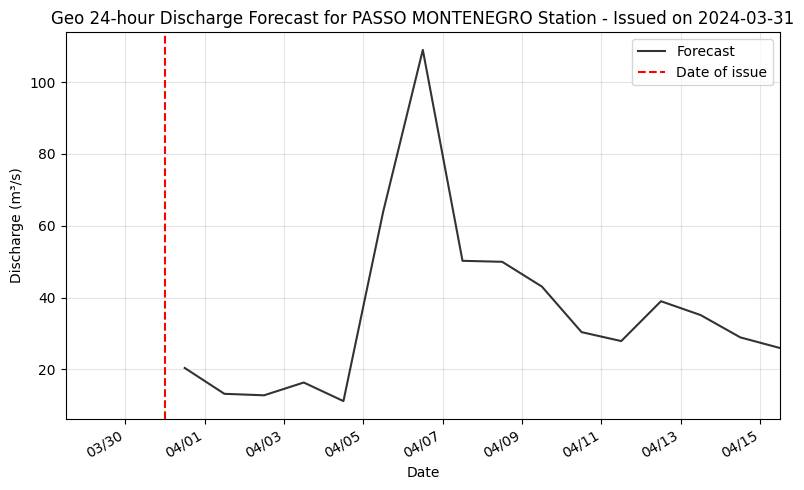

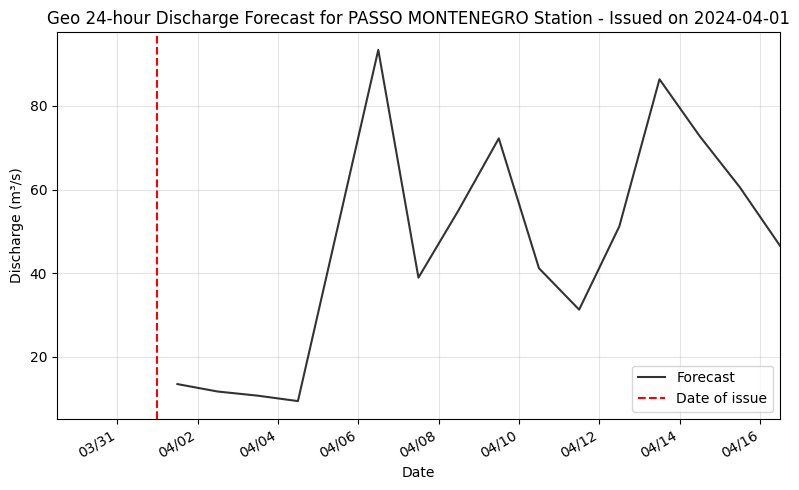

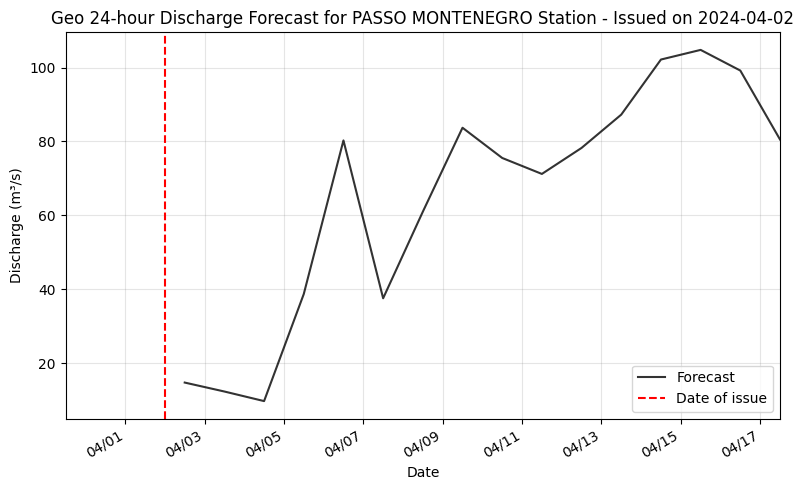

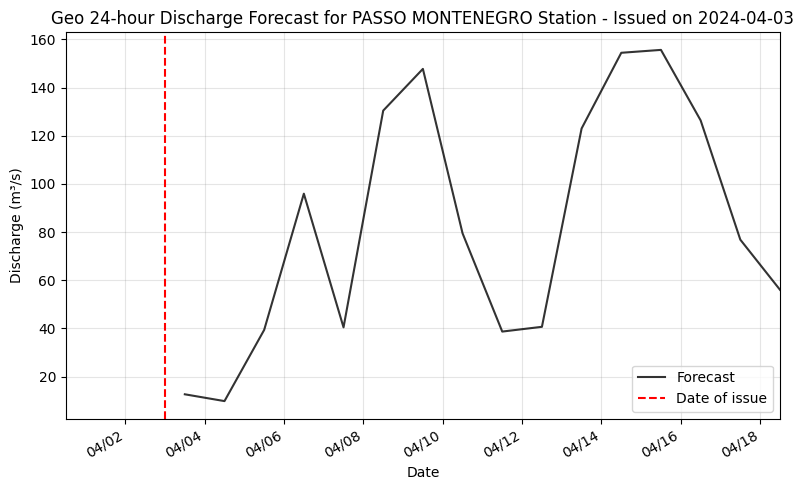

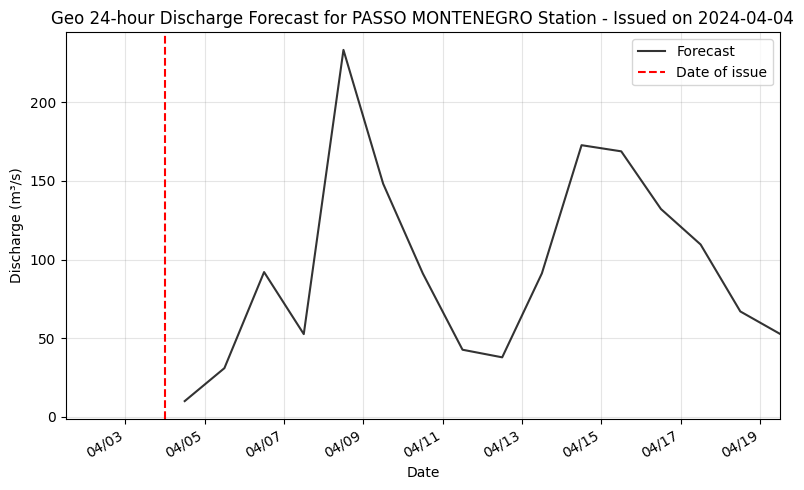

...

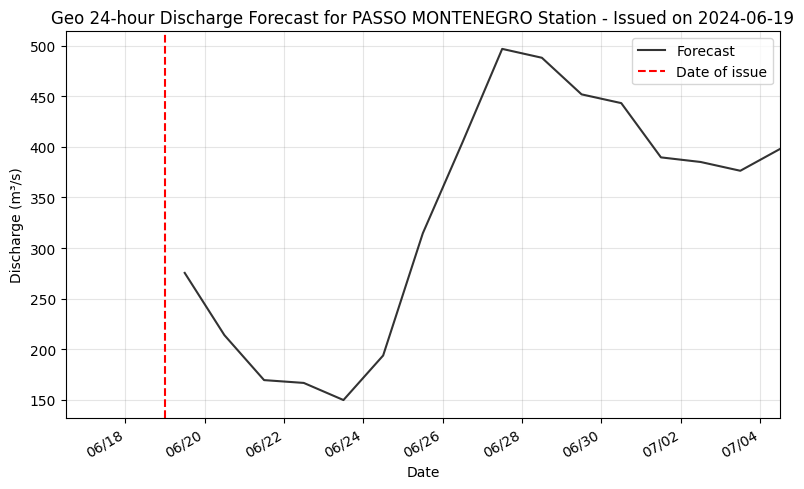

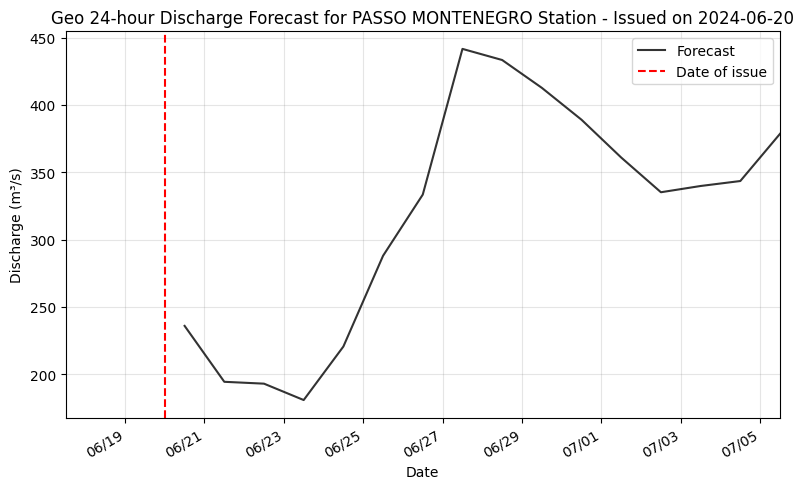

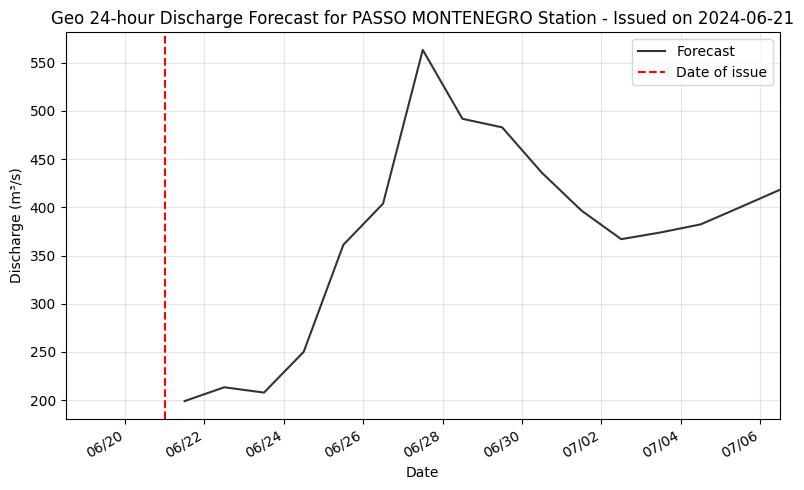

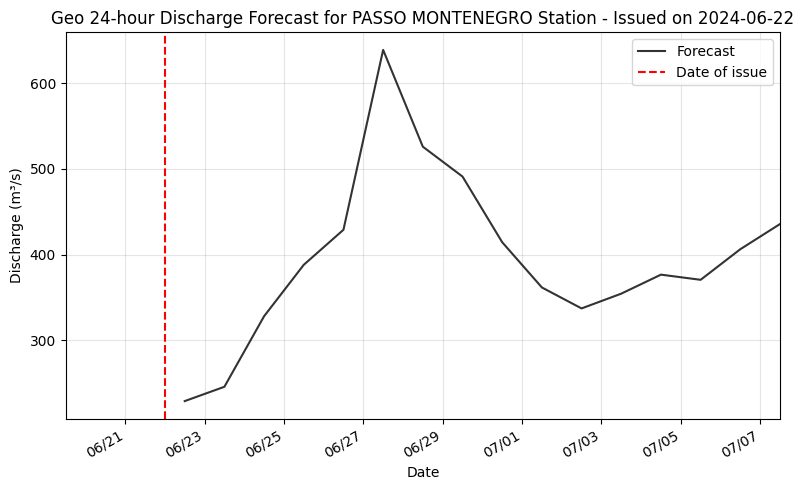

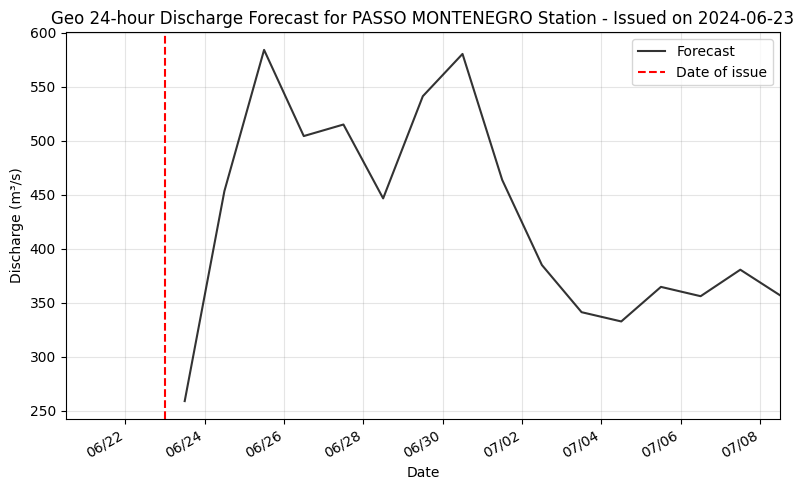

KeyboardInterrupt: 

In [12]:

# Specify the directory paths
hist_folder_path = f'Historic_{name_data}'
telem_folder_path = 'Telemetricas'

# Loop through each station using the 'Code' column
for index, row in info_stations.iterrows():

    # if index != 6:
    #     continue

    station_name = row['Name']
    station_code = row['Code']

    print('----------------------------------------------------------------------------')
    print(station_code)
    print(station_name)

    # Read telemetric data
    df_telem = read_station('../Telemetricas', station_code)

    # Process data
    processed_data = process_geo_data(file_data, index, info_stations)


    plot_geo_forecasts(processed_data, station_name, name_data)


    # # Save the processed data to a file
    # with open(f'data_geo_{station_code}.pkl', 'wb') as file:
    #     pickle.dump(processed_data, file)


        

